<a href="https://colab.research.google.com/github/achmadrachmandika/PCVK/blob/main/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Nama: Achmad Rachmandika Rizky Pratama
##Kelas: 3A
##NIM: 2041720125

1. Buatlah fungsi konvolusi menggunakan algoritma yang telah dijelaskan pada Bagian C, tanpa
menggunakan library atau metode konvolusi dari OpenCV.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Akses file yang terdapat pada drive dan import beberapa library yang dibutuhkan

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

 Buatlah fungsi konvolusi. Catatan: parameter yang digunakan boleh dimodifikasi.
Misal, hanya menggunakan parameter image dan kernel saja, atau image, kernel, dan
padding.

In [7]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  # convolution process
  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return new_image

In [8]:
img_1 = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/female (1).tiff')
img_2 = cv.resize(img_1, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_1, cv.COLOR_BGR2GRAY)

3. Buat Image Filter untuk Average filter, low pass filter, high pass filter, dan beberapa filter berikut:

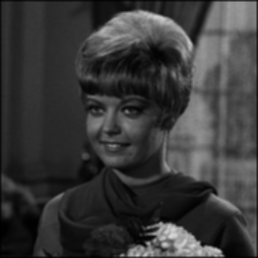

In [9]:
#Average Filter
kernel_average = np.ones((3, 3), np.float32) / 9.0
cv2_imshow(convolution2d(img_gray, kernel_average, 1, 2))

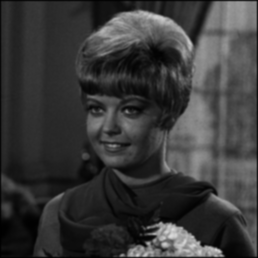

In [10]:
#Low pass filter
gauss_kernel_3x3 = np.array([[1, 2, 1],
                             [2, 4, 2],
                             [1, 2, 1]], dtype=np.float32) / 16.0
cv2_imshow(convolution2d(img_gray, gauss_kernel_3x3, 1, 2))

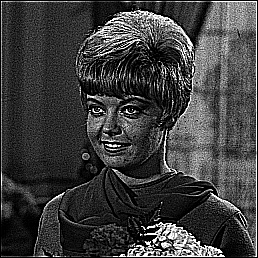

In [11]:
#High pass filter
highpass = np.array([[-1, -1, -1],
                    [-1,  9, -1],
                    [-1, -1, -1]], dtype=np.float32)
cv2_imshow(convolution2d(img_gray, highpass, 1, 2))

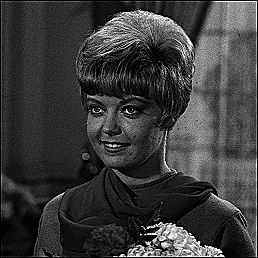

In [12]:
#Sharpen

kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
cv2_imshow(convolution2d(img_gray, kernel_sharpen, 1, 2))


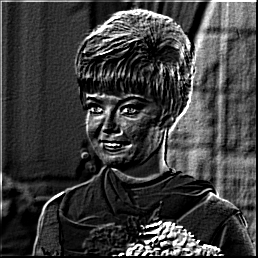

In [13]:
#Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
cv2_imshow(convolution2d(img_gray, kernel_embos, 1, 2))


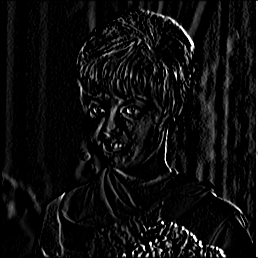

In [14]:
#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])
cv2_imshow(convolution2d(img_gray, kernel_sobel, 1, 2))

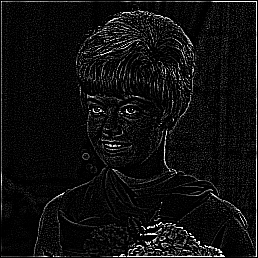

In [15]:
#Canny Edge Detection

kernel_edge = np.array([[-1, -1, -1],
                           [-1, 8, -1],
                           [-1, -1, -1]])
cv2_imshow(convolution2d(img_gray, kernel_edge, 1, 2))

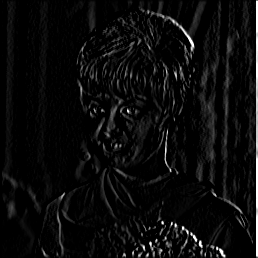

In [16]:
#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
cv2_imshow(convolution2d(img_gray, kernel_edge, 1, 2))

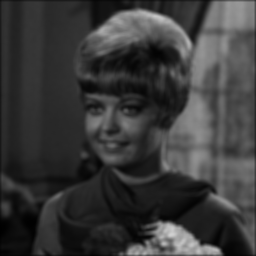

In [17]:
#5x5 Gaussian Blur

kernel_size = 5
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))

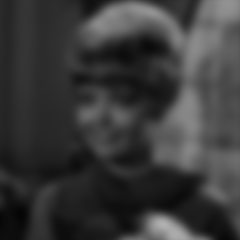

In [18]:
#21x21 Gaussian Blur

kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))

E. Tugas
Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui
implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan
operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP

In [19]:
img_k = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/ktp.png')
img_l = cv.resize(img_k, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_k, cv.COLOR_BGR2GRAY)

(-0.5, 1054.5, 679.5, -0.5)

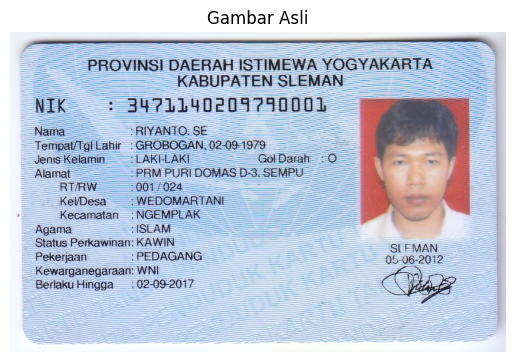

In [20]:
# Menampilkan gambar
plt.imshow(cv.cvtColor(img_k, cv.COLOR_BGR2RGB))
plt.title('Gambar Asli')
plt.axis('off')

(-0.5, 1054.5, 679.5, -0.5)

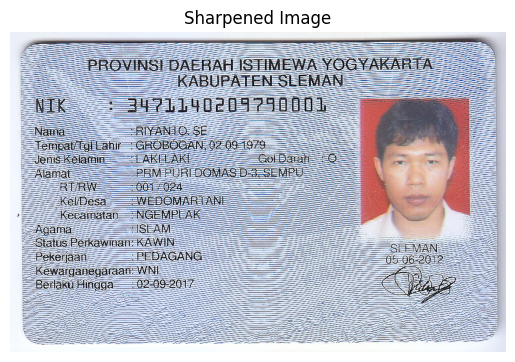

In [21]:
# Menggunakan metode Shaperning
kernel_sharpening2 = np.array([
    [0,-1,0],
    [-1, 5,-1],
    [0,-1,0]
])
sharpened_image = cv.filter2D(img_k, -1, kernel_sharpening2)
# Sharpened
plt.imshow(cv.cvtColor(sharpened_image, cv.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.axis('off')

(-0.5, 1054.5, 679.5, -0.5)

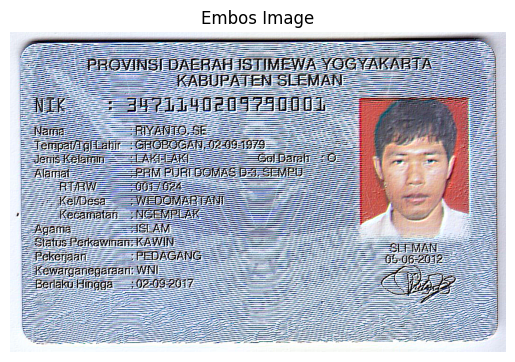

In [22]:
#Menggunakan metode Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
embos_image = cv.filter2D(img_k, -1, kernel_embos)
plt.imshow(cv.cvtColor(embos_image, cv.COLOR_BGR2RGB))
plt.title('Embos Image')
plt.axis('off')

(-0.5, 1054.5, 679.5, -0.5)

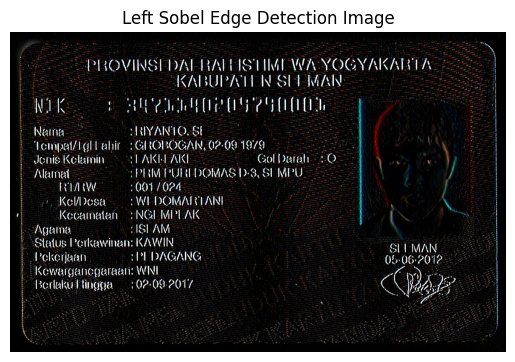

In [23]:
#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
leftsobel_image = cv.filter2D(img_k, -1, kernel_sobel)
plt.imshow(cv.cvtColor(leftsobel_image, cv.COLOR_BGR2RGB))
plt.title('Left Sobel Edge Detection Image')
plt.axis('off')

(-0.5, 1054.5, 679.5, -0.5)

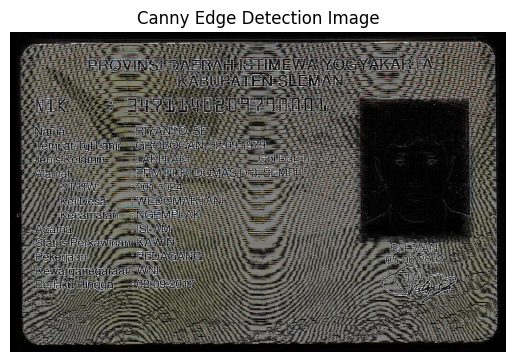

In [24]:
#Canny Edge

kernel_canny_edge = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1]
])
canny_image = cv.filter2D(img_k, -1, kernel_canny_edge)
plt.imshow(cv.cvtColor(canny_image, cv.COLOR_BGR2RGB))
plt.title('Canny Edge Detection Image')
plt.axis('off')

(-0.5, 1054.5, 679.5, -0.5)

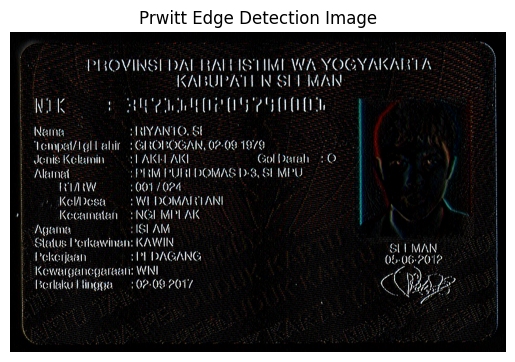

In [25]:
#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
edge_image = cv.filter2D(img_k, -1, kernel_edge)
plt.imshow(cv.cvtColor(edge_image, cv.COLOR_BGR2RGB))
plt.title('Prwitt Edge Detection Image')
plt.axis('off')

In [26]:
# Menggunakan metode Histogram Equalization
r, g, b = cv.split(img_k)
r_eq = cv.equalizeHist(r)
g_eq = cv.equalizeHist(g)
b_eq = cv.equalizeHist(b)
image_result = cv.merge([r_eq, g_eq, b_eq])

(-0.5, 1054.5, 679.5, -0.5)

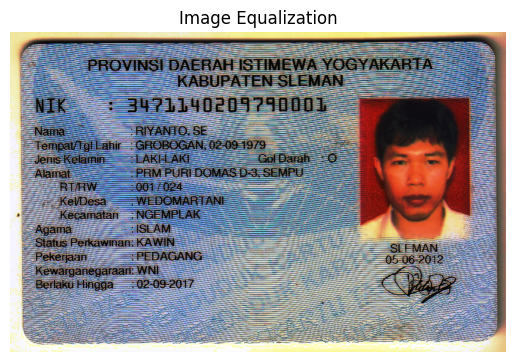

In [27]:
# Equalization
plt.imshow(cv.cvtColor(image_result, cv.COLOR_BGR2RGB))
plt.title('Image Equalization')
plt.axis('off')

In [31]:
# Menggunakan metode Gamma
gamma = 0.5
gamma_image = np.zeros(img_k.shape, img_k.dtype)
for x in range(img_k.shape[0]):
    for y in range(img_k.shape[1]):
        for z in range(img_k.shape[2]):
            gamma_image[x, y, z] = np.clip(255 * pow(img_k[x, y, z] / 255, (1 / gamma)), 0, 255)

(-0.5, 1054.5, 679.5, -0.5)

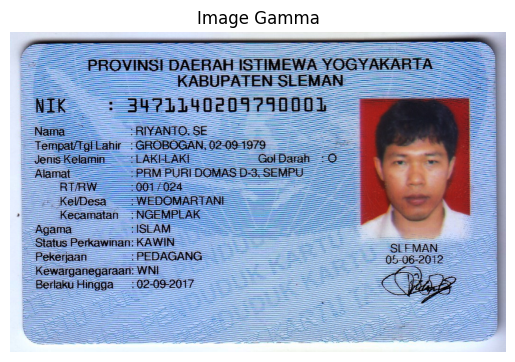

In [32]:
# Gamma Correction
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.title('Image Gamma')
plt.axis('off')

KTP 2

In [57]:
img_k1 = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/ktp1.png')
img_2 = cv.resize(img_k1, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_k1, cv.COLOR_BGR2GRAY)

In [58]:
# Menggunakan metode Shaperning
kernel_sharpening2 = np.array([
    [0,-1,0],
    [-1, 5,-1],
    [0,-1,0]
])
sharpened_image = cv.filter2D(img_k1, -1, kernel_sharpening2)

#Menggunakan metode Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
embos_image = cv.filter2D(img_k1, -1, kernel_embos)

#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
leftsobel_image = cv.filter2D(img_k1, -1, kernel_sobel)

#Canny Edge

kernel_canny_edge = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1]
])
canny_image = cv.filter2D(img_k1, -1, kernel_canny_edge)

#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
edge_image = cv.filter2D(img_k1, -1, kernel_edge)

# Menggunakan metode Histogram Equalization
r, g, b = cv.split(img_k1)
r_eq = cv.equalizeHist(r)
g_eq = cv.equalizeHist(g)
b_eq = cv.equalizeHist(b)
image_result = cv.merge([r_eq, g_eq, b_eq])

# Menggunakan metode Gamma
gamma = 0.5
gamma_image = np.zeros(img_k1.shape, img_k1.dtype)
for x in range(img_k1.shape[0]):
    for y in range(img_k1.shape[1]):
        for z in range(img_k1.shape[2]):
            gamma_image[x, y, z] = np.clip(255 * pow(img_k1[x, y, z] / 255, (1 / gamma)), 0, 255)

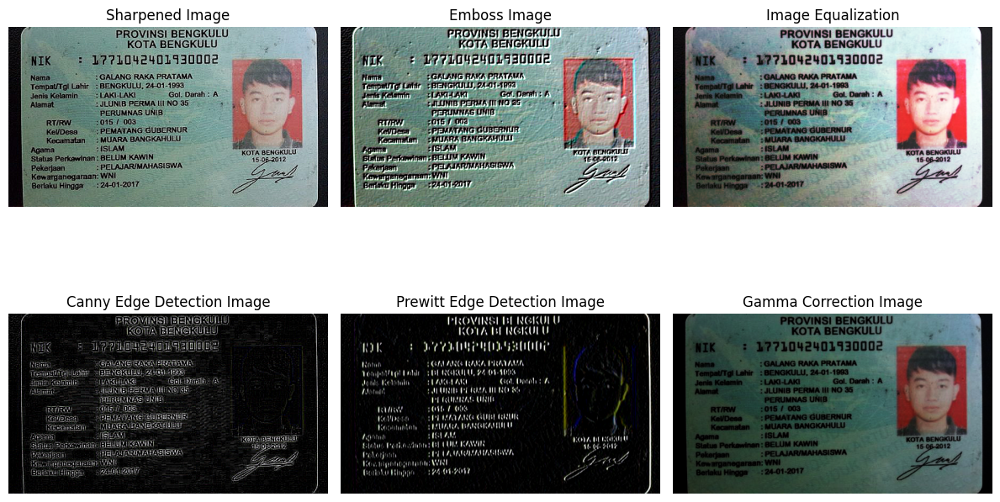

In [61]:
# Tampilkan hasil secara bersamaan
plt.figure(figsize=(12, 8))


plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(sharpened_image, cv.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(embos_image, cv.COLOR_BGR2RGB))
plt.title('Emboss Image')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(leftsobel_image, cmap='gray')
plt.title('Left Sobel Edge Detection Image')
plt.axis('off')

# Equalization
plt.imshow(cv.cvtColor(image_result, cv.COLOR_BGR2RGB))
plt.title('Image Equalization')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(canny_image, cmap='gray')
plt.title('Canny Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(edge_image, cmap='gray')
plt.title('Prewitt Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.title('Gamma Correction Image')
plt.axis('off')

plt.tight_layout()
plt.show()

KTP 3

In [37]:
#KTP3
img_k3 = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/ktp3.png')
img_2 = cv.resize(img_k3, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_k3, cv.COLOR_BGR2GRAY)

In [38]:
# Menggunakan metode Shaperning
kernel_sharpening2 = np.array([
    [0,-1,0],
    [-1, 5,-1],
    [0,-1,0]
])
sharpened_image = cv.filter2D(img_k3, -1, kernel_sharpening2)

#Menggunakan metode Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
embos_image = cv.filter2D(img_k3, -1, kernel_embos)

#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
leftsobel_image = cv.filter2D(img_k3, -1, kernel_sobel)

#Canny Edge

kernel_canny_edge = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1]
])
canny_image = cv.filter2D(img_k3, -1, kernel_canny_edge)

#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
edge_image = cv.filter2D(img_k3, -1, kernel_edge)

# Menggunakan metode Histogram Equalization
r, g, b = cv.split(img_k3)
r_eq = cv.equalizeHist(r)
g_eq = cv.equalizeHist(g)
b_eq = cv.equalizeHist(b)
image_result = cv.merge([r_eq, g_eq, b_eq])

# Menggunakan metode Gamma
gamma = 0.5
gamma_image = np.zeros(img_k3.shape, img_k3.dtype)
for x in range(img_k3.shape[0]):
    for y in range(img_k3.shape[1]):
        for z in range(img_k3.shape[2]):
            gamma_image[x, y, z] = np.clip(255 * pow(img_k3[x, y, z] / 255, (1 / gamma)), 0, 255)

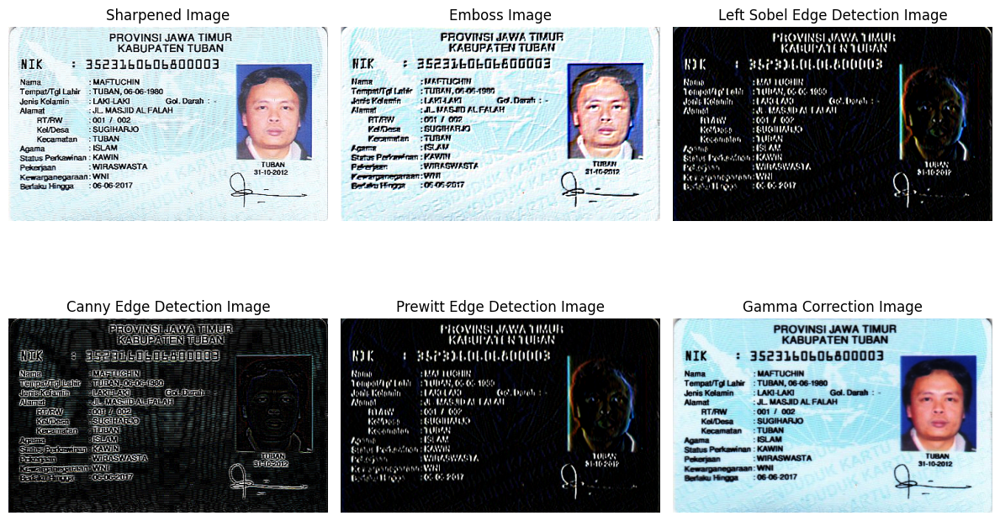

In [39]:
# Tampilkan hasil secara bersamaan
plt.figure(figsize=(12, 8))


plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(sharpened_image, cv.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(embos_image, cv.COLOR_BGR2RGB))
plt.title('Emboss Image')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(leftsobel_image, cmap='gray')
plt.title('Left Sobel Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(canny_image, cmap='gray')
plt.title('Canny Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(edge_image, cmap='gray')
plt.title('Prewitt Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.title('Gamma Correction Image')
plt.axis('off')

plt.tight_layout()
plt.show()

KTP 4

In [43]:
img_k4 = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/ktp4.png')
img_4 = cv.resize(img_k4, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_k4, cv.COLOR_BGR2GRAY)

In [44]:
# Menggunakan metode Shaperning
kernel_sharpening2 = np.array([
    [0,-1,0],
    [-1, 5,-1],
    [0,-1,0]
])
sharpened_image = cv.filter2D(img_k4, -1, kernel_sharpening2)

#Menggunakan metode Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
embos_image = cv.filter2D(img_k4, -1, kernel_embos)

#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
leftsobel_image = cv.filter2D(img_k4, -1, kernel_sobel)

#Canny Edge

kernel_canny_edge = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1]
])
canny_image = cv.filter2D(img_k4, -1, kernel_canny_edge)

#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
edge_image = cv.filter2D(img_k4, -1, kernel_edge)

# Menggunakan metode Histogram Equalization
r, g, b = cv.split(img_k4)
r_eq = cv.equalizeHist(r)
g_eq = cv.equalizeHist(g)
b_eq = cv.equalizeHist(b)
image_result = cv.merge([r_eq, g_eq, b_eq])

# Menggunakan metode Gamma
gamma = 0.5
gamma_image = np.zeros(img_k4.shape, img_k4.dtype)
for x in range(img_k4.shape[0]):
    for y in range(img_k4.shape[1]):
        for z in range(img_k4.shape[2]):
            gamma_image[x, y, z] = np.clip(255 * pow(img_k4[x, y, z] / 255, (1 / gamma)), 0, 255)

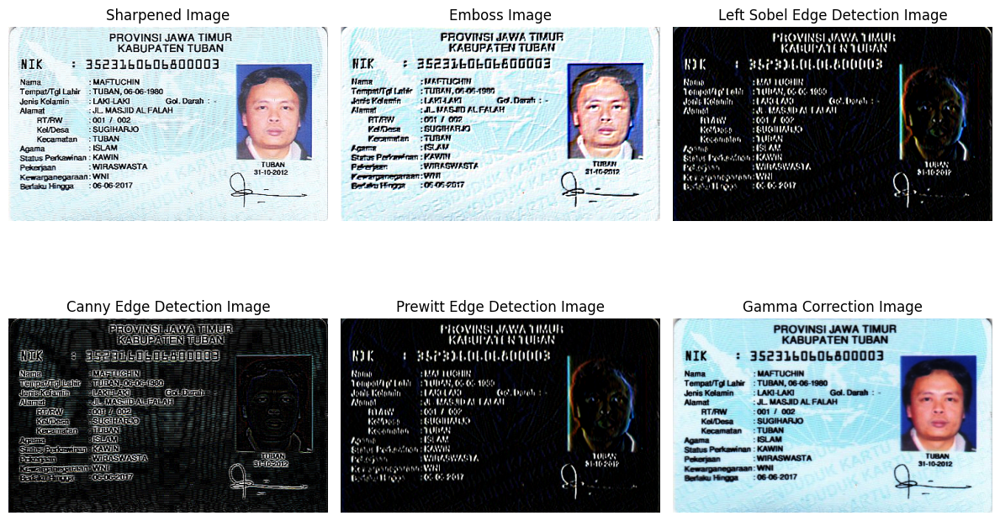

In [47]:
# Tampilkan hasil secara bersamaan
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(sharpened_image, cv.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(embos_image, cv.COLOR_BGR2RGB))
plt.title('Emboss Image')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(leftsobel_image, cmap='gray')
plt.title('Left Sobel Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(canny_image, cmap='gray')
plt.title('Canny Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(edge_image, cmap='gray')
plt.title('Prewitt Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.title('Gamma Correction Image')
plt.axis('off')

plt.tight_layout()
plt.show()

KTP 5

In [48]:
img_k5 = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/ktp5.png')
img_5 = cv.resize(img_k5, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_k5, cv.COLOR_BGR2GRAY)

In [51]:
# Menggunakan metode Shaperning
kernel_sharpening2 = np.array([
    [0,-1,0],
    [-1, 5,-1],
    [0,-1,0]
])
sharpened_image = cv.filter2D(img_k5, -1, kernel_sharpening2)

#Menggunakan metode Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
embos_image = cv.filter2D(img_k5, -1, kernel_embos)

#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
leftsobel_image = cv.filter2D(img_k5, -1, kernel_sobel)

#Canny Edge

kernel_canny_edge = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1]
])
canny_image = cv.filter2D(img_k5, -1, kernel_canny_edge)

#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
edge_image = cv.filter2D(img_k5, -1, kernel_edge)

# Menggunakan metode Histogram Equalization
r, g, b = cv.split(img_k5)
r_eq = cv.equalizeHist(r)
g_eq = cv.equalizeHist(g)
b_eq = cv.equalizeHist(b)
image_result = cv.merge([r_eq, g_eq, b_eq])

# Menggunakan metode Gamma
gamma = 0.5
gamma_image = np.zeros(img_k5.shape, img_k5.dtype)
for x in range(img_k5.shape[0]):
    for y in range(img_k5.shape[1]):
        for z in range(img_k5.shape[2]):
            gamma_image[x, y, z] = np.clip(255 * pow(img_k5[x, y, z] / 255, (1 / gamma)), 0, 255)

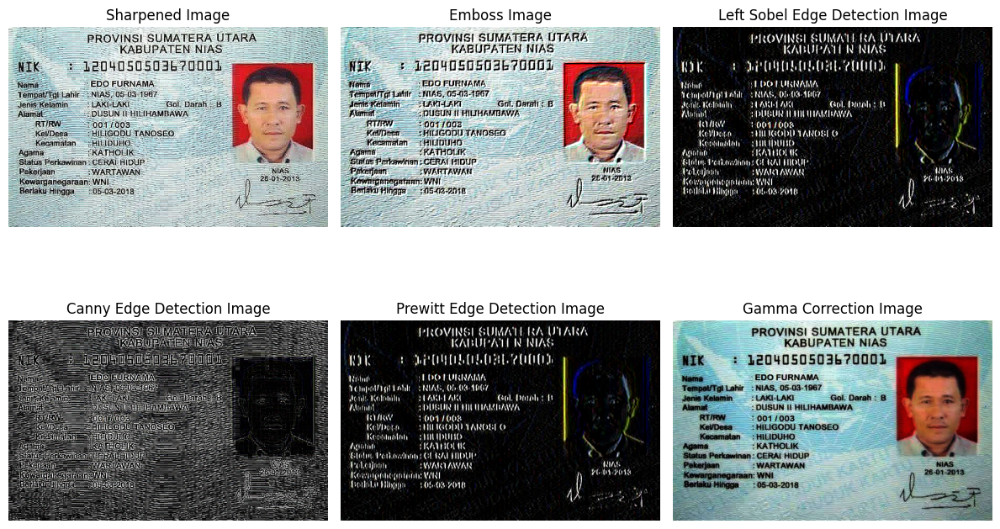

In [52]:
# Tampilkan hasil secara bersamaan
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(sharpened_image, cv.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(embos_image, cv.COLOR_BGR2RGB))
plt.title('Emboss Image')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(leftsobel_image, cmap='gray')
plt.title('Left Sobel Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(canny_image, cmap='gray')
plt.title('Canny Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(edge_image, cmap='gray')
plt.title('Prewitt Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.title('Gamma Correction Image')
plt.axis('off')

plt.tight_layout()
plt.show()

KTP 6

In [53]:
img_k6 = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/ktp6.png')
img_6 = cv.resize(img_k6, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_k6, cv.COLOR_BGR2GRAY)

In [54]:
# Menggunakan metode Shaperning
kernel_sharpening2 = np.array([
    [0,-1,0],
    [-1, 5,-1],
    [0,-1,0]
])
sharpened_image = cv.filter2D(img_k6, -1, kernel_sharpening2)

#Menggunakan metode Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
embos_image = cv.filter2D(img_k6, -1, kernel_embos)

#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
leftsobel_image = cv.filter2D(img_k6, -1, kernel_sobel)

#Canny Edge

kernel_canny_edge = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1]
])
canny_image = cv.filter2D(img_k6, -1, kernel_canny_edge)

#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
edge_image = cv.filter2D(img_k6, -1, kernel_edge)

# Menggunakan metode Histogram Equalization
r, g, b = cv.split(img_k6)
r_eq = cv.equalizeHist(r)
g_eq = cv.equalizeHist(g)
b_eq = cv.equalizeHist(b)
image_result = cv.merge([r_eq, g_eq, b_eq])

# Menggunakan metode Gamma
gamma = 0.5
gamma_image = np.zeros(img_k6.shape, img_k6.dtype)
for x in range(img_k6.shape[0]):
    for y in range(img_k6.shape[1]):
        for z in range(img_k6.shape[2]):
            gamma_image[x, y, z] = np.clip(255 * pow(img_k6[x, y, z] / 255, (1 / gamma)), 0, 255)

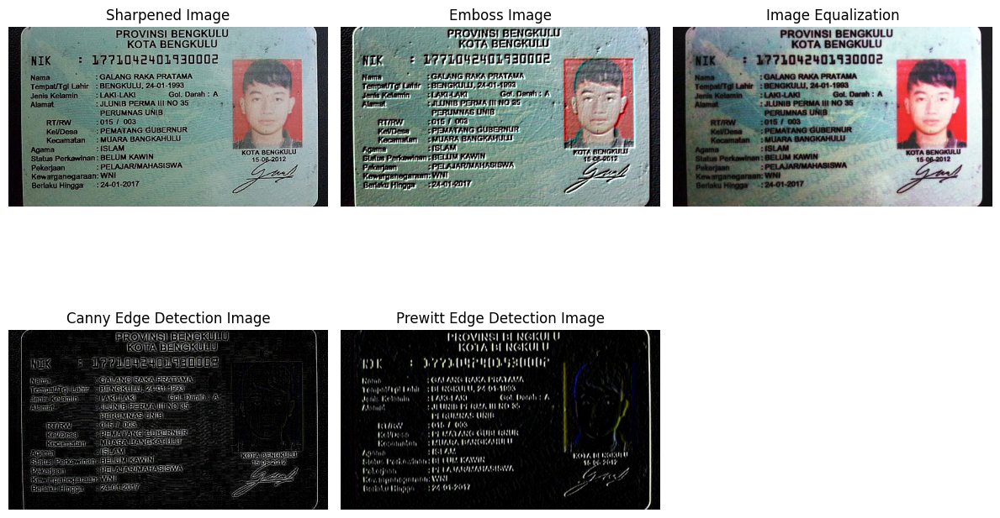

In [63]:
# Tampilkan hasil secara bersamaan
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(sharpened_image, cv.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(embos_image, cv.COLOR_BGR2RGB))
plt.title('Emboss Image')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(leftsobel_image, cmap='gray')
plt.title('Left Sobel Edge Detection Image')
plt.axis('off')


# Equalization
plt.imshow(cv.cvtColor(image_result, cv.COLOR_BGR2RGB))
plt.title('Image Equalization')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(canny_image, cmap='gray')
plt.title('Canny Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(edge_image, cmap='gray')
plt.title('Prewitt Edge Detection Image')
plt.axis('off')



plt.tight_layout()
plt.show()

KTP 7

In [64]:
img_k7 = cv.imread('/content/drive/MyDrive/Kuliah Semester 5/PCVK/Week7/KTP7.jpeg')
img_7 = cv.resize(img_k7, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_k7, cv.COLOR_BGR2GRAY)

In [65]:
# Menggunakan metode Shaperning
kernel_sharpening2 = np.array([
    [0,-1,0],
    [-1, 5,-1],
    [0,-1,0]
])
sharpened_image = cv.filter2D(img_k7, -1, kernel_sharpening2)

#Menggunakan metode Emboss

kernel_embos = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
embos_image = cv.filter2D(img_k7, -1, kernel_embos)

#Left Sobel Edge Detection

kernel_sobel = np.array([[1, 0, -1],
                         [2, 0, -2],
                         [1, 0, -1]])
leftsobel_image = cv.filter2D(img_k7, -1, kernel_sobel)

#Canny Edge

kernel_canny_edge = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1]
])
canny_image = cv.filter2D(img_k7, -1, kernel_canny_edge)

#Prewitt Edge Detection
kernel_edge = np.array([[1, 0, -1],
                        [1, 0, -1],
                        [1, 0, -1]], dtype=np.float32)
edge_image = cv.filter2D(img_k7, -1, kernel_edge)

# Menggunakan metode Histogram Equalization
r, g, b = cv.split(img_k7)
r_eq = cv.equalizeHist(r)
g_eq = cv.equalizeHist(g)
b_eq = cv.equalizeHist(b)
image_result = cv.merge([r_eq, g_eq, b_eq])

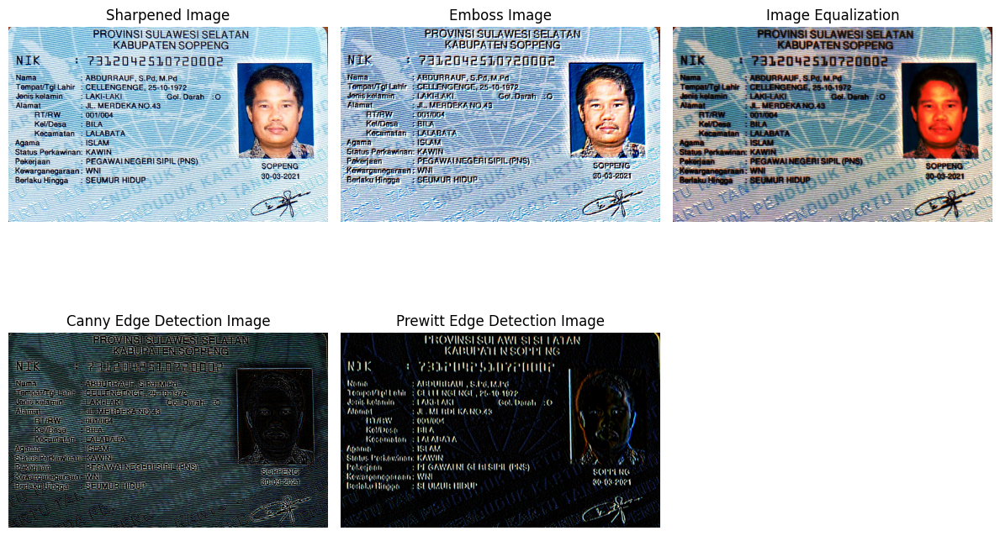

In [66]:
# Tampilkan hasil secara bersamaan
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(sharpened_image, cv.COLOR_BGR2RGB))
plt.title('Sharpened Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(embos_image, cv.COLOR_BGR2RGB))
plt.title('Emboss Image')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(leftsobel_image, cmap='gray')
plt.title('Left Sobel Edge Detection Image')
plt.axis('off')


# Equalization
plt.imshow(cv.cvtColor(image_result, cv.COLOR_BGR2RGB))
plt.title('Image Equalization')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(canny_image, cmap='gray')
plt.title('Canny Edge Detection Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(edge_image, cmap='gray')
plt.title('Prewitt Edge Detection Image')
plt.axis('off')



plt.tight_layout()
plt.show()